# Breast Cancer Early Detection Using Machine Learning Algorithm

# Importing the libraries

In [332]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, VotingClassifier, AdaBoostClassifier, HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, ConfusionMatrixDisplay, ConfusionMatrixDisplay, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FactorAnalysis
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier



## Importing the dataset

In [266]:
# Load Data
cancer_data = pd.read_csv('breast-cancer.csv')

In [267]:
# View First
cancer_data.head(20)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.26540,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.18600,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.24300,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.25750,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.16250,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.17410,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.19320,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.15560,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.20600,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.22100,0.4366,0.20750


In [268]:
# Shape of Data
cancer_data.shape

(569, 32)

In [269]:
# Get a summary of the data types and missing values
cancer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

# Data Cleaning

In [270]:
# Check for missing values and drop rows with missing values
cancer_data.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

**Checking for Duplicate Data**

In [271]:
# Check for duplicate rows
print("Number of duplicate rows:", cancer_data.duplicated().sum())

Number of duplicate rows: 0


**Remove 'ID' Column**

In [272]:
# Remove the 'id' column
cancer_data = cancer_data.drop(columns=['id'])

## Converting the Dependent Variable

In [273]:
# Convert the dependent variable 'diagnosis' to 1 (Malignant) and 0 (Benign)
cancer_data['diagnosis'] = cancer_data['diagnosis'].apply(lambda x: 1 if x == 'M' else 0)

In [274]:
# Check
cancer_data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Exploratory Data Analysis (EDA)

In [275]:
# Summary Statistics
print("Summary Statistics:")
cancer_data.describe()

Summary Statistics:


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


**Distribution Of The Dependent Variable**


Target Variable Distribution:
diagnosis
0    357
1    212
Name: count, dtype: int64


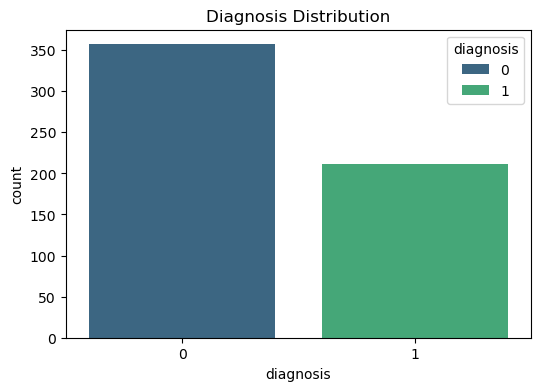

In [276]:
# Distribution Analysis
print("\nTarget Variable Distribution:")
print(cancer_data['diagnosis'].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x='diagnosis', data=cancer_data, hue='diagnosis', palette='viridis')
plt.title('Diagnosis Distribution')
plt.show()

**Histogram - Plot Continuous Variables**

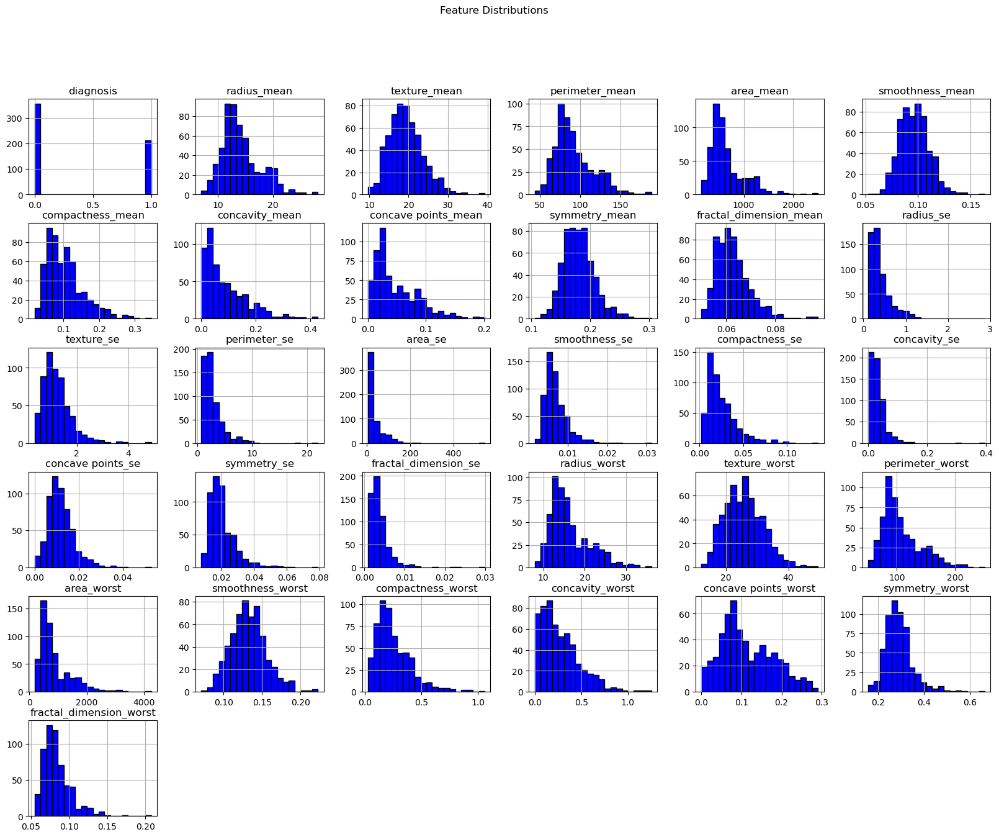

In [277]:
# Histograms 
cancer_data.hist(figsize=(20, 15), bins=20, color='blue', edgecolor='black')
plt.suptitle('Feature Distributions')
plt.show()

**BoxPlot For Outlier**

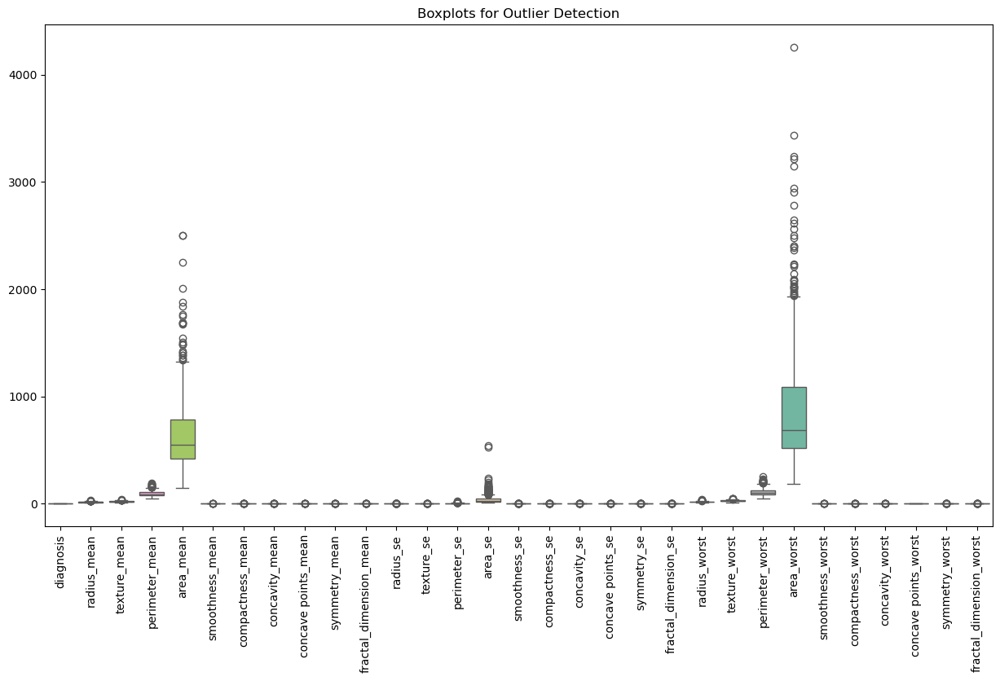

In [278]:
# Outliers Detection
plt.figure(figsize=(15, 8))
sns.boxplot(data=cancer_data, palette='Set2')
plt.title('Boxplots for Outlier Detection')
plt.xticks(rotation=90)
plt.show()

**Correlation Test**

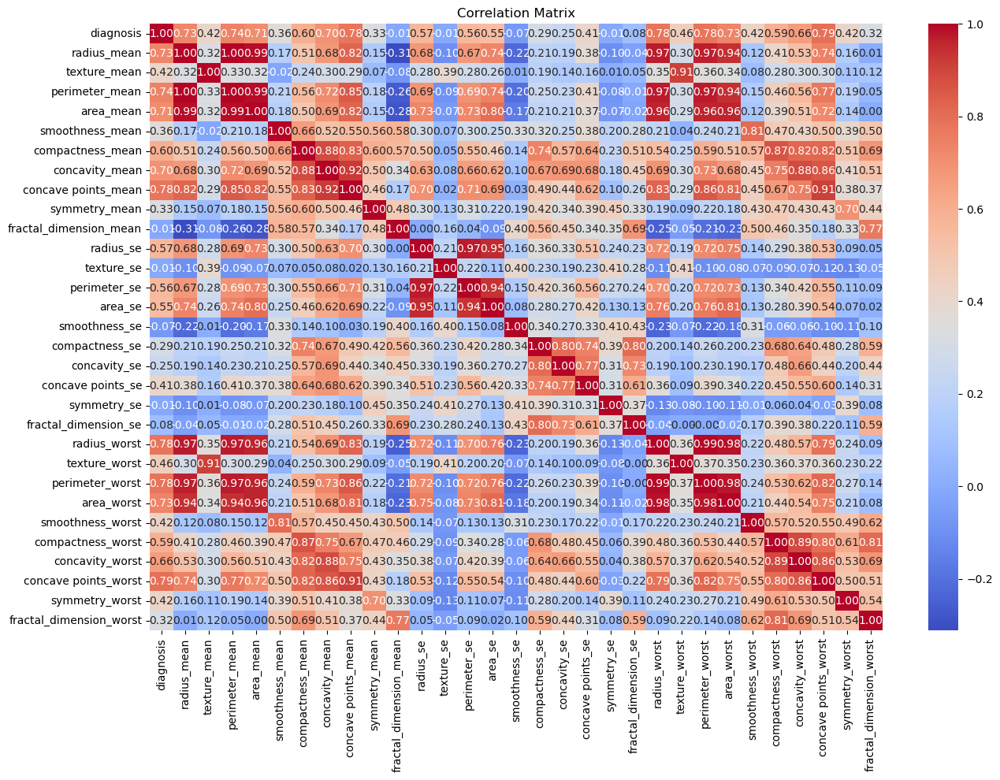

In [279]:
#Correlation Analysis
correlation_matrix = cancer_data.corr()
plt.figure(figsize=(15,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# The variables show high correlation between one another. Attempting to remove the correlated variables resulted in decreased performance of the model. 
# Consequently, the decision was made to retain the correlated variables to preserve the model's effectiveness.

**Relationship Analysis**

In [280]:
# Relationship Analysis
sns.pairplot(cancer_data, hue='diagnosis', diag_kind='kde', corner=True)
plt.show()

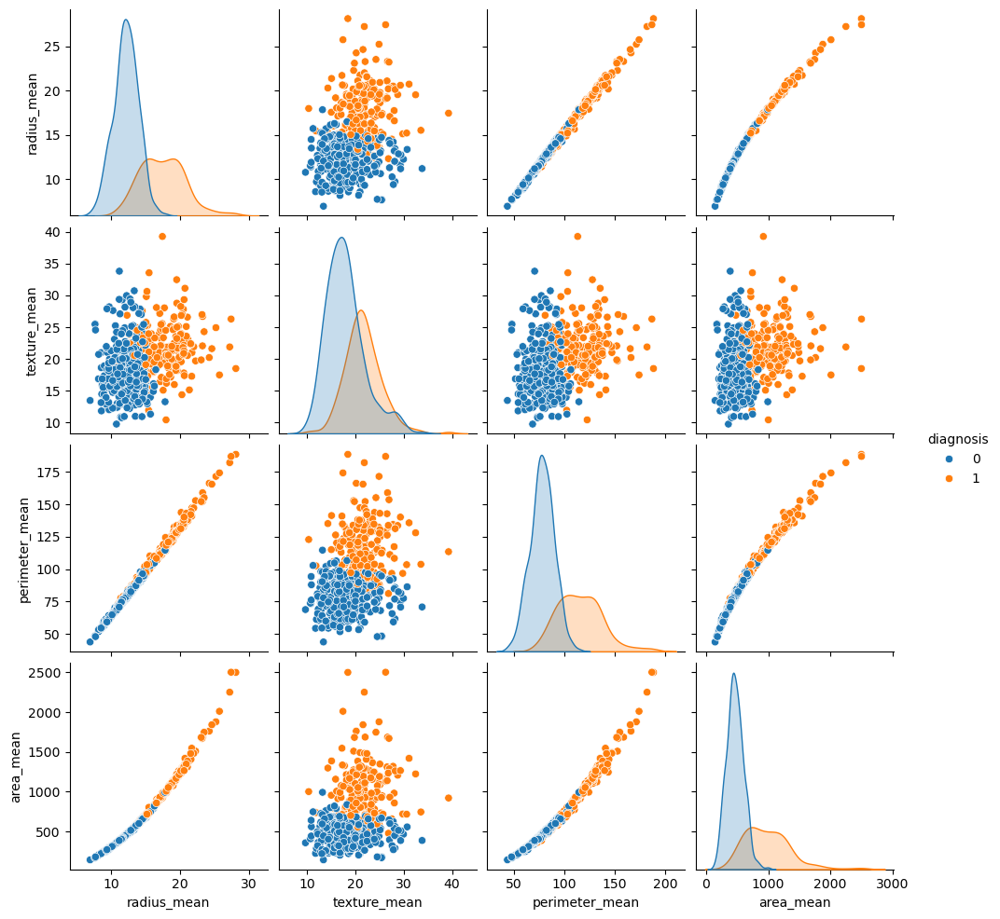

In [281]:
# Visualization of Relationships
sns.pairplot(cancer_data, vars=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean'], hue='diagnosis')
plt.show()

## Separate Dependent Variables and Independent Variable

In [336]:
# Train-Test Split
X = cancer_data.drop(columns=['diagnosis'])
y = cancer_data['diagnosis']

# Normalization 

In [337]:
# Scaled numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split Train and Test

In [338]:
# Split Data into 70% Training and 20% Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Model Building With Voting Classifier

In [339]:
# Voting Classifier with multiple models
clf1 = LogisticRegression(random_state=1)
clf2 = RandomForestClassifier(n_estimators=50, random_state=1)
clf3 = GaussianNB()
clf4 = AdaBoostClassifier(n_estimators=50, random_state=1)
clf5 = HistGradientBoostingClassifier(random_state=1)
clf6 = KNeighborsClassifier()

In [340]:
eclf = VotingClassifier(
    estimators=[('lr', clf1), ('rf', clf2), ('gnb', clf3), ('ada', clf4), ('hgb', clf5), ('knn', clf6)],
    voting='hard')

for clf, label in zip([clf1, clf2, clf3, clf4, clf5, clf6, eclf], ['Logistic Regression', 'Random Forest', 'Naive Bayes', 'AdaBoost', 'HistGradientBoosting', 'KNN', 'Ensemble']):
    scores = cross_val_score(clf, X, y, scoring='accuracy', cv=5)
    print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))

/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

Accuracy: 0.95 (+/- 0.01) [Logistic Regression]
Accuracy: 0.96 (+/- 0.02) [Random Forest]
Accuracy: 0.94 (+/- 0.01) [Naive Bayes]
Accuracy: 0.97 (+/- 0.02) [AdaBoost]
Accuracy: 0.97 (+/- 0.01) [HistGradientBoosting]
Accuracy: 0.93 (+/- 0.02) [KNN]


/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

Accuracy: 0.96 (+/- 0.02) [Ensemble]


## Confusion Matrix 


Confusion Matrix for LogisticRegression:
[[70  1]
 [ 4 39]]


/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


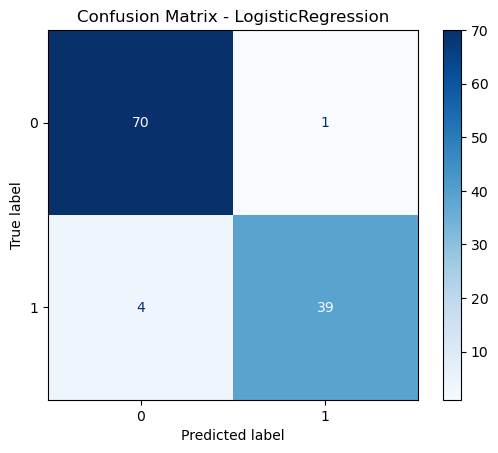

In [341]:
# Confusion Matrix for LogisticRegression
clf1.fit(X_train, y_train)
y_pred_ada = clf1.predict(X_test)
print("\nConfusion Matrix for LogisticRegression:")
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
print(conf_matrix_ada)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix_ada).plot(cmap='Blues')
plt.title('Confusion Matrix - LogisticRegression')
plt.show()


Confusion Matrix for Random Forest:
[[70  1]
 [ 3 40]]


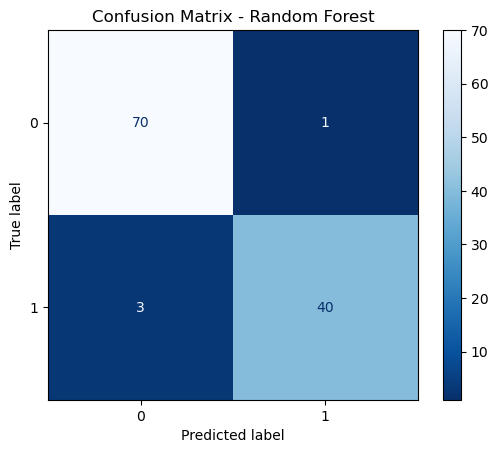

In [342]:
# Confusion Matrix for Random Forest
clf2.fit(X_train, y_train)
y_pred_ada = clf2.predict(X_test)
print("\nConfusion Matrix for Random Forest:")
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
print(conf_matrix_ada)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix_ada).plot(cmap='Blues_r')
plt.title('Confusion Matrix - Random Forest')
plt.show()


Confusion Matrix for Support Vector Machine(SVM):
[[71  0]
 [ 3 40]]


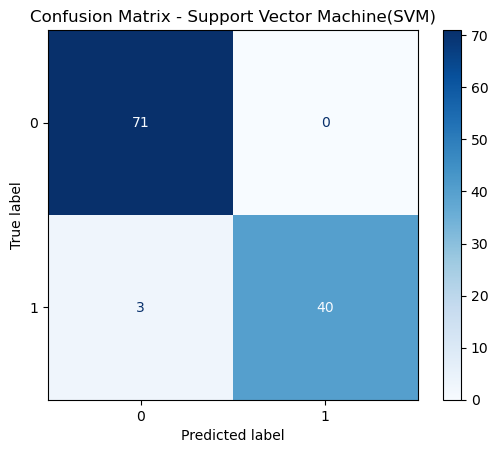

In [343]:
# Confusion Matrix for SVM
clf3.fit(X_train, y_train)
y_pred_ada = clf3.predict(X_test)
print("\nConfusion Matrix for Support Vector Machine(SVM):")
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
print(conf_matrix_ada)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix_ada).plot(cmap='Blues')
plt.title('Confusion Matrix - Support Vector Machine(SVM)')
plt.show()


Confusion Matrix for AdaBoost:
[[70  1]
 [ 2 41]]


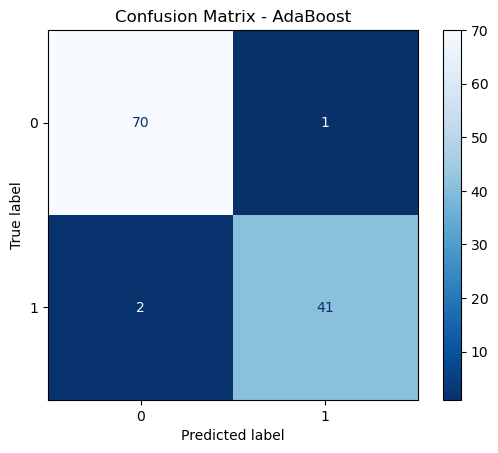

In [344]:
# Confusion Matrix for AdaBoost
clf4.fit(X_train, y_train)
y_pred_ada = clf4.predict(X_test)
print("\nConfusion Matrix for AdaBoost:")
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)
print(conf_matrix_ada)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix_ada).plot(cmap='Blues_r')
plt.title('Confusion Matrix - AdaBoost')
plt.show()


Confusion Matrix for HistGradientBoosting:
[[70  1]
 [ 2 41]]


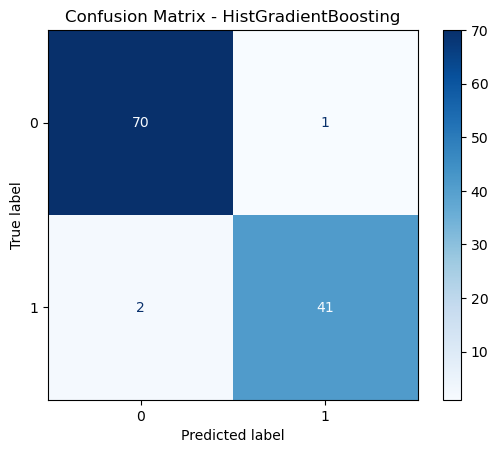

In [345]:
# Confusion Matrix for HistGradientBoosting
clf5.fit(X_train, y_train)
y_pred_hgb = clf5.predict(X_test)
print("\nConfusion Matrix for HistGradientBoosting:")
conf_matrix_hgb = confusion_matrix(y_test, y_pred_hgb)
print(conf_matrix_hgb)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix_hgb).plot(cmap='Blues')
plt.title('Confusion Matrix - HistGradientBoosting')
plt.show()


Confusion Matrix for KNearestNeighbors:
[[71  0]
 [ 5 38]]


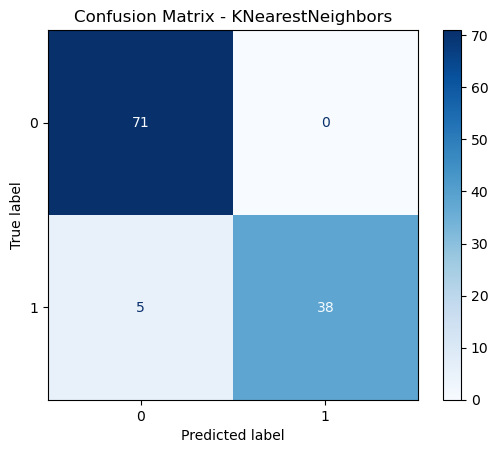

In [346]:
# Confusion Matrix for KNearestNeighbors
clf6.fit(X_train, y_train)
y_pred_hgb = clf6.predict(X_test)
print("\nConfusion Matrix for KNearestNeighbors:")
conf_matrix_hgb = confusion_matrix(y_test, y_pred_hgb)
print(conf_matrix_hgb)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix_hgb).plot(cmap='Blues')
plt.title('Confusion Matrix - KNearestNeighbors')
plt.show()

## ROC-AUC

AUC for AdaBoost: 1.00


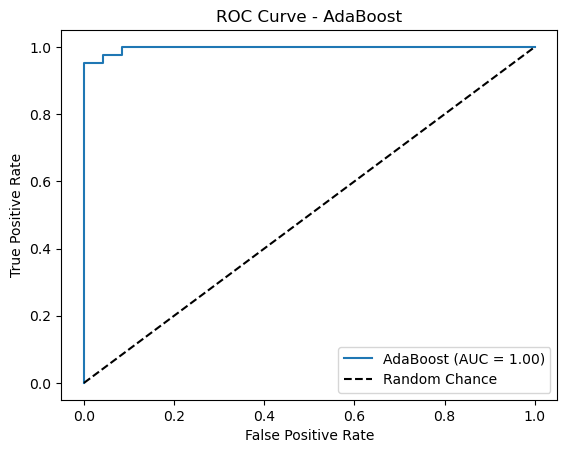

In [347]:
# ROC Curve for AdaBoost
y_prob_ada = ada_clf.predict_proba(X_test)[:, 1]
auc_ada = roc_auc_score(y_test, y_prob_ada)

print(f"AUC for AdaBoost: {auc_ada:.2f}")

fpr_ada, tpr_ada, _ = roc_curve(y_test, y_prob_ada)
plt.figure()
plt.plot(fpr_ada, tpr_ada, label=f'AdaBoost (AUC = {auc_ada:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - AdaBoost')
plt.legend()
plt.show()

AUC for HistGradientBoosting: 0.99


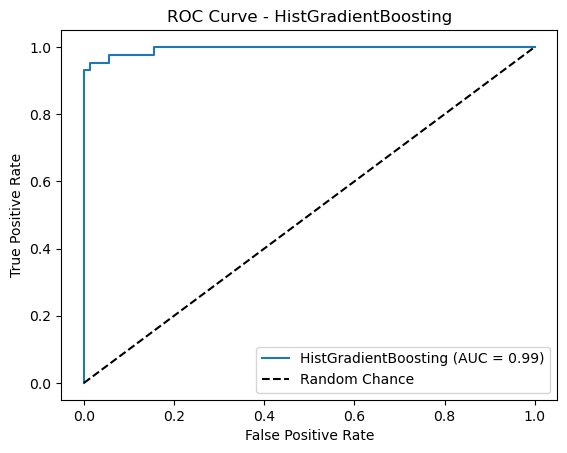

In [348]:
# ROC Curve for HistGradientBoosting
y_prob_hgb = hgb_clf.predict_proba(X_test)[:, 1]
auc_hgb = roc_auc_score(y_test, y_prob_hgb)

print(f"AUC for HistGradientBoosting: {auc_hgb:.2f}")

fpr_hgb, tpr_hgb, _ = roc_curve(y_test, y_prob_hgb)
plt.figure()
plt.plot(fpr_hgb, tpr_hgb, label=f'HistGradientBoosting (AUC = {auc_hgb:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - HistGradientBoosting')
plt.legend()



## Feature Importance 

<Figure size 1000x600 with 0 Axes>

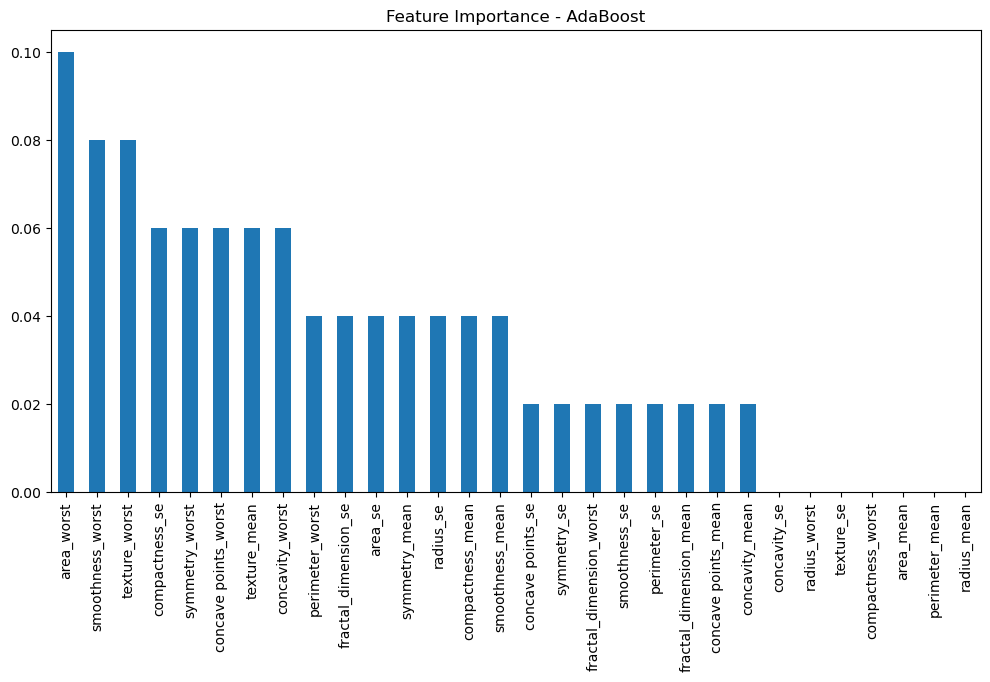


Modeling and analysis complete!


In [352]:
# Feature Importance For AdaBoost
feature_importances = pd.DataFrame(clf4.feature_importances_, index=X.columns, columns=['Importance']).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
feature_importances.plot(kind='bar', figsize=(12, 6), legend=False)
plt.title('Feature Importance - AdaBoost')
plt.show()

print("\nModeling and analysis complete!")
